# Cerebellar Mean Field model

### Hands-on -  "Camillo Golgi" School, Erice 29th November - 3rd December 2022
<b> Roberta Maria Lorenzi, Alice Geminiani, Fulvia Palesi and Claudia Casellato </b>
<br>contact: robertamaria.lorenzi01@universitadipavia.it</br>

## What is the Mean Field?

Mean Field (MF) is an approximation technique that provides a statistical summary of a spiking neural network behaviour (SNN). In practice, the activity of a complex SNN (many equations!!!) is summarized through the statistical moments of membrane voltage fluctuation (average μV, the standard deviation σV and the autocorrelation time 𝜏V).

The heuristic approach used here (Zerlaut et al., 2016; 2018) relies on Transfer Function (TF) that allows to transfer microscale propeties (single neuron) into mesoscale (MF granularity).

For further info, please refer to the Reference box at the end of this tutorial


### Let's start and have fun !!! :)

In [1]:
#pip install plotly

In [29]:
## Import the packages
#standard packages
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#single cell and syn parameters
from params_library.cell_library import get_neuron_params
from params_library.syn_and_connec_library import get_connectivity_and_synapses_matrix
from params_library.params_reformat import reformat_syn_parameters_eglif,pseq_eglif

#simulators
from numerical_network.eglif_simulator import eglif_solver, plot_eglif
from numerical_network.alpha_cond_generation import g_alpha_inhib, g_alpha_exc, plot_g_alpha

#TF fitting
from transfer_function.fitting_TF import *

#MF simulation
from MF_prediction import input_library, theoretical_tools
from MF_prediction.load_config_TF import load_transfer_functions

# Don't know how to call this
from numerical_network.useful_stuff import read_csv_file

In [2]:
def load_pop_info(neuron, network):
    
    params = get_neuron_params(neuron)
    M = get_connectivity_and_synapses_matrix(network)
    reformat_syn_parameters_eglif(neuron, params, M)
    
    return params

### Single neuron model

E-GLIF is a point neuron model derived from the leaky-integrate-and-fire model family (LIF),
which computes the membrane potential dynamic with a set of three interconnected equations (section 3.3.1), explicitly accounting for the time evolution of
adaptation and depolarization currents.

\begin{equation}
\frac{dV_m}{dt} = \frac{1}{C_m}(\frac{Cm}{\tau_m}(V_m(t) - E_L) -I_a(t) + I_d(t) + I_e(t)+I_s)
\end{equation}

\begin{equation}
\frac{dI_a}{dt} = k_a(V_m(t) - E_L) - k_2 I_a(t)
\end{equation}

\begin{equation}
\frac{dI_d}{dt} = - k_1I_d(t)
\end{equation}

(Is = external stimulation current; Cm = membrane capacitance; τm = membrane time constant; EL = resting potential; Ie = endogenous current; ka, k2 = adaptation constants; k1 = Id decay rate)


When a spike occurs: V = V_reset ; Ia = Ia + A2 ; Idep = A1 (V_reset = reset value for the membrane voltage,A2, A1 = update constants)

(Extra info: Geminiani et al.,2018 https://doi.org/10.3389/fninf.2018.00088 and Geminiani et al., 2019 https://doi.org/10.3389/fncom.2019.00035)

Here below you can simulate the neuron activity:

In [3]:
#Single neuron model: E-GLIF.

#cerebellar neuron
neuron = 'PC'

#network configuration
network = 'CRBL_CONFIG_20PARALLEL_wN'

params = load_pop_info(neuron,network)

#uncomment to print the parameters
print(params)

synaptic network_scaffold parameters in SI units [V, F, s]
{'name': '', 'N': 1, 'Gl': 7.1064e-09, 'Cm': 3.34e-10, 'Trefrac': 0.0005, 'tm': 0.047, 'El': -0.059000000000000004, 'Vthre': -0.043000000000000003, 'Vreset': -0.069, 'delta_v': 0.0035, 'kadap': 1.491e-06, 'k2': 41.0, 'k1': 195.0, 'A2': 1.72622e-10, 'A1': 1.57622e-10, 'Ie': 8.910408e-10, 'Qe': 1.126e-09, 'Te': 0.0011, 'Ee': 0.0, 'Ke': 374.5, 'Qi': 1.244e-09, 'Ti': 0.0028, 'Ei': -0.08, 'Ki': 10.28}


In [4]:
#An example of E-GLIF simulation
tstop = 0.5 #s
dt = 1e-4 #s
fe = 20 #Hz
fi =  10 #Hz
t = np.arange(int(tstop/dt))*dt

print('Parameters for the E-GLIF simulation\n')
print('simulation length[s] = ',tstop,'\ntime step [s] = ',dt,'\nfe [Hz] = ',fe, '\nfi [Hz] = ', fi)

Parameters for the E-GLIF simulation

simulation length[s] =  0.5 
time step [s] =  0.0001 
fe [Hz] =  20 
fi [Hz] =  10


In [5]:
t = np.arange(int(tstop/dt))*dt
I = np.zeros(len(t))

ge = g_alpha_exc(t, fe, params)
gi = g_alpha_inhib(t, fi, params)

vm, tspikes = eglif_solver(t, I, ge, gi, *pseq_eglif(params))

Let's have a look to the membran potential simulated with E-GLIF! 

In [6]:
#Membrane Potential
plot_eglif(t, vm, tspikes)

E-GLIF equations are the functional reference for the TF computation. In practice, Numerical TF is a grid of value computed by solving E-GLIF (above) modeling SNN neurons activity for a set of excitatory and inhibitory input frequencies (fe and fi respectively).

In [7]:
tot_spikes = len(tspikes)
fout = tot_spikes/3*t.max()/4

print('Total number of spikes = ', tot_spikes)
print('Output activity [Hz] = ', fout)

Total number of spikes =  34
Output activity [Hz] =  1.4163833333333333


The "output activity" correspond to a value of the numerical TF

## Transfer Funcrion Formalism (TF)

TFs are the core of this formalis, anabling us to translate single neuron properties to a mesoscale level by computing population-level conductances that in turns depend on the statistical moment of the membran potential fluctations(In the code: muV  = average, sV = standard deviation and TvN = autocorrelation time (normalized)).

According to Zerlaut et al.,2018, the analytical TF was derived from the numerical TF with the steps below:

## Numerical TF

For different couple of presynaptic fe,fi the numerical TF is computed for each population included in the network.
Here we include MLI and PC with presynaptic connections: GrC-MLI and GrC-PC (excitatory); MLI-MLI and MLI-PC (inhibitory)

In [8]:
#Run eglif_sim for a pair of (fe,fi) and return the output firing rate
def single_experiment_eglif_alpha(t, fe, fi, params):

    I = np.zeros(len(t))

    vm, t_spikes = eglif_solver(t, I, g_alpha_exc(t, fe, params), g_alpha_inhib(t, fi, params),
                                   *pseq_eglif(params))

    froutput = ( len(t_spikes) / (3 * t.max() / 4))
    
    del vm
    del t_spikes

    return froutput

In [9]:
# Loop for the numerical TF
def compute_numerical_TF(params, t, Fe, Fi, verbose=True):

    print('***************************** Computing  numerical TF ************************************')
    print('*******************************************************************************************')

    numTF = np.zeros((Fi.size, Fe.size))
    SDfreq = np.zeros((Fi.size, Fe.size))
    
    for fi in range(len(Fi)):
        for fe in range(len(Fe)):

            froutput = single_experiment_eglif_alpha(t, Fe[fe], Fi[fi], params)

            if verbose:
                print(" exc :", fe, " over ", Fe.size, ' Fe= ', Fe[fe])
                print(" inh :", fi, " over ", Fi.size, ' Fi= ', Fi[fi])
                print('Fout: ', froutput)

            numTF[fi, fe] = froutput.mean()
            SDfreq[fi,fe] = froutput.std()

            del froutput

    print('************************************ Done ;)***********************************************')
    print('*******************************************************************************************')

    return numTF, SDfreq


In [10]:
def plot_cmap_2D_template(numTF, Fe_vec, Fi_vec, pop_name, y_inhib_label, x_excit_label, font_size =15):

    cm_sel = plt.get_cmap("viridis")

    plt.figure(1, figsize=(7,7))
    plt.imshow(numTF, origin = 'lower')

    plt.title(pop_name + ' TF numerical template [Hz]', fontsize = font_size+2)
    plt.xticks(np.arange(0, len(Fe_vec)), [round(f, 2) for f in Fe_vec], fontsize=font_size, rotation = 90)
    plt.yticks(np.arange(len(Fi_vec)), [round(f, 2) for f in Fi_vec], fontsize=font_size)

    ticks = np.linspace(numTF.min(), numTF.max(), 5, endpoint=True)

    color_map = plt.cm.ScalarMappable(cmap=cm_sel)
    color_map.set_array(numTF.ravel())
    color_map.autoscale()

    axcb = plt.colorbar(color_map, ticks = ticks, shrink = 0.8, format='%.0f')
    axcb.set_label("Numerical TF [Hz]", labelpad=10, size=font_size+1) #labelpad to avoid overlaps of the title with ticks
    axcb.ax.tick_params(labelsize=15)
    plt.xlabel(x_excit_label, fontsize = font_size+1 )
    plt.ylabel(y_inhib_label, fontsize = font_size+1)
    plt.show()

In [11]:
#Load fe,fi combination in the actual working frequencies range
from numerical_network.useful_stuff import read_csv_file

csv_stats = ['data/grc_fr_stats.csv','data/mli_fr_stats.csv']

f_drive, fe_mean = read_csv_file(csv_stats[0])
_, fi_mean = read_csv_file(csv_stats[1])

In [12]:
#define the simulation time
t = np.arange(0, 5+1e-4, 1e-4)

Numerical TF routine would take 2-3 minutes each :) Let's have a coffee!

In [13]:
#Load params of MLI
params_MLI = load_pop_info('MLI', 'CRBL_CONFIG_20PARALLEL_wN')

#Run the routine!!!
numTF_MLI, SD_MLI = compute_numerical_TF(params_MLI, t, fe_mean, fi_mean, verbose=True)

synaptic network_scaffold parameters in SI units [V, F, s]
***************************** Computing  numerical TF ************************************
*******************************************************************************************
 exc : 0  over  21  Fe=  0.41783031602400933
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  0.8
 exc : 1  over  21  Fe=  1.6783895391001833
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  16.8
 exc : 2  over  21  Fe=  3.012015571809874
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  31.2
 exc : 3  over  21  Fe=  4.30226332073665
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  46.13333333333333
 exc : 4  over  21  Fe=  5.6763840928447475
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  61.6
 exc : 5  over  21  Fe=  6.897743175156509
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  74.93333333333334
 exc : 6  over  21  Fe=  8.093585838730217
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  86.93333333333334
 exc : 7  over  21  Fe=  9.39924407569

 exc : 11  over  21  Fe=  14.32799707084587
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  117.6
 exc : 12  over  21  Fe=  15.576579916148187
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  129.6
 exc : 13  over  21  Fe=  16.852823558541907
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  140.26666666666668
 exc : 14  over  21  Fe=  17.95045014707154
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  148.26666666666668
 exc : 15  over  21  Fe=  19.025395385420822
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  156.8
 exc : 16  over  21  Fe=  20.20503161397503
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  165.33333333333334
 exc : 17  over  21  Fe=  21.26989580235762
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  172.26666666666668
 exc : 18  over  21  Fe=  22.250715296406618
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  178.93333333333334
 exc : 19  over  21  Fe=  23.199483673566018
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  185.06666666666666
 exc : 2

 exc : 3  over  21  Fe=  4.30226332073665
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  2.1333333333333333
 exc : 4  over  21  Fe=  5.6763840928447475
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  10.666666666666666
 exc : 5  over  21  Fe=  6.897743175156509
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  21.333333333333332
 exc : 6  over  21  Fe=  8.093585838730217
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  30.133333333333333
 exc : 7  over  21  Fe=  9.399244075696833
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  42.13333333333333
 exc : 8  over  21  Fe=  10.65713867406206
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  53.06666666666667
 exc : 9  over  21  Fe=  11.925960398884797
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  66.4
 exc : 10  over  21  Fe=  13.157550305126287
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  78.13333333333334
 exc : 11  over  21  Fe=  14.32799707084587
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  89.866666666666

 exc : 16  over  21  Fe=  20.20503161397503
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  127.46666666666667
 exc : 17  over  21  Fe=  21.26989580235762
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  135.2
 exc : 18  over  21  Fe=  22.250715296406618
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  145.06666666666666
 exc : 19  over  21  Fe=  23.199483673566018
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  152.53333333333333
 exc : 20  over  21  Fe=  24.17349982788889
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  158.93333333333334
 exc : 0  over  21  Fe=  0.41783031602400933
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  0.0
 exc : 1  over  21  Fe=  1.6783895391001833
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  0.0
 exc : 2  over  21  Fe=  3.012015571809874
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  0.0
 exc : 3  over  21  Fe=  4.30226332073665
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  0.0
 exc : 4  over  21  Fe=  5.67638409284

 exc : 9  over  21  Fe=  11.925960398884797
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  33.86666666666667
 exc : 10  over  21  Fe=  13.157550305126287
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  41.86666666666667
 exc : 11  over  21  Fe=  14.32799707084587
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  55.2
 exc : 12  over  21  Fe=  15.576579916148187
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  65.06666666666666
 exc : 13  over  21  Fe=  16.852823558541907
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  77.6
 exc : 14  over  21  Fe=  17.95045014707154
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  87.73333333333333
 exc : 15  over  21  Fe=  19.025395385420822
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  97.06666666666666
 exc : 16  over  21  Fe=  20.20503161397503
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  108.0
 exc : 17  over  21  Fe=  21.26989580235762
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  118.13333333333334
 exc : 

 exc : 2  over  21  Fe=  3.012015571809874
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  0.0
 exc : 3  over  21  Fe=  4.30226332073665
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  0.0
 exc : 4  over  21  Fe=  5.6763840928447475
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  0.0
 exc : 5  over  21  Fe=  6.897743175156509
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  2.6666666666666665
 exc : 6  over  21  Fe=  8.093585838730217
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  5.333333333333333
 exc : 7  over  21  Fe=  9.399244075696833
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  12.0
 exc : 8  over  21  Fe=  10.65713867406206
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  17.066666666666666
 exc : 9  over  21  Fe=  11.925960398884797
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  24.533333333333335
 exc : 10  over  21  Fe=  13.157550305126287
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  32.0
 exc : 11  over  21  Fe=  14.32799707084587
 inh : 18 

In [15]:
#Load params of PC
params_PC = load_pop_info('PC', 'CRBL_CONFIG_20PARALLEL_wN')

#Run the routine!!!
numTF_PC, SD_PC = compute_numerical_TF(params_PC, t, fe_mean, fi_mean, verbose=True)

synaptic network_scaffold parameters in SI units [V, F, s]
***************************** Computing  numerical TF ************************************
*******************************************************************************************
 exc : 0  over  21  Fe=  0.41783031602400933
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  32.53333333333333
 exc : 1  over  21  Fe=  1.6783895391001833
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  36.0
 exc : 2  over  21  Fe=  3.012015571809874
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  39.46666666666667
 exc : 3  over  21  Fe=  4.30226332073665
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  43.46666666666667
 exc : 4  over  21  Fe=  5.6763840928447475
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  47.46666666666667
 exc : 5  over  21  Fe=  6.897743175156509
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  51.46666666666667
 exc : 6  over  21  Fe=  8.093585838730217
 inh : 0  over  21  Fi=  3.26604915543817
Fout:  54.9333333333333

 exc : 12  over  21  Fe=  15.576579916148187
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  76.0
 exc : 13  over  21  Fe=  16.852823558541907
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  79.73333333333333
 exc : 14  over  21  Fe=  17.95045014707154
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  83.46666666666667
 exc : 15  over  21  Fe=  19.025395385420822
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  86.66666666666667
 exc : 16  over  21  Fe=  20.20503161397503
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  90.4
 exc : 17  over  21  Fe=  21.26989580235762
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  93.6
 exc : 18  over  21  Fe=  22.250715296406618
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  96.8
 exc : 19  over  21  Fe=  23.199483673566018
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  99.73333333333333
 exc : 20  over  21  Fe=  24.17349982788889
 inh : 3  over  21  Fi=  12.247466456218271
Fout:  102.93333333333334
 exc : 0  over  21  Fe=  0.41

 exc : 4  over  21  Fe=  5.6763840928447475
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  42.13333333333333
 exc : 5  over  21  Fe=  6.897743175156509
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  45.86666666666667
 exc : 6  over  21  Fe=  8.093585838730217
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  49.333333333333336
 exc : 7  over  21  Fe=  9.399244075696833
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  53.86666666666667
 exc : 8  over  21  Fe=  10.65713867406206
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  57.333333333333336
 exc : 9  over  21  Fe=  11.925960398884797
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  61.6
 exc : 10  over  21  Fe=  13.157550305126287
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  65.6
 exc : 11  over  21  Fe=  14.32799707084587
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  69.06666666666666
 exc : 12  over  21  Fe=  15.576579916148187
 inh : 7  over  21  Fi=  21.792896365622063
Fout:  72.8
 exc : 13  over  21  F

 exc : 17  over  21  Fe=  21.26989580235762
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  88.8
 exc : 18  over  21  Fe=  22.250715296406618
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  92.0
 exc : 19  over  21  Fe=  23.199483673566018
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  95.2
 exc : 20  over  21  Fe=  24.17349982788889
 inh : 10  over  21  Fi=  27.910992747630154
Fout:  98.13333333333334
 exc : 0  over  21  Fe=  0.41783031602400933
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  20.266666666666666
 exc : 1  over  21  Fe=  1.6783895391001833
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  26.4
 exc : 2  over  21  Fe=  3.012015571809874
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  31.733333333333334
 exc : 3  over  21  Fe=  4.30226332073665
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  35.733333333333334
 exc : 4  over  21  Fe=  5.6763840928447475
 inh : 11  over  21  Fi=  29.671099677292155
Fout:  39.46666666666667
 exc : 5  over  21  Fe=

 exc : 8  over  21  Fe=  10.65713867406206
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  53.6
 exc : 9  over  21  Fe=  11.925960398884797
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  57.86666666666667
 exc : 10  over  21  Fe=  13.157550305126287
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  61.86666666666667
 exc : 11  over  21  Fe=  14.32799707084587
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  64.8
 exc : 12  over  21  Fe=  15.576579916148187
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  69.06666666666666
 exc : 13  over  21  Fe=  16.852823558541907
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  73.33333333333333
 exc : 14  over  21  Fe=  17.95045014707154
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  76.53333333333333
 exc : 15  over  21  Fe=  19.025395385420822
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  79.73333333333333
 exc : 16  over  21  Fe=  20.20503161397503
 inh : 14  over  21  Fi=  34.375780909351285
Fout:  83.466666666666

 exc : 20  over  21  Fe=  24.17349982788889
 inh : 17  over  21  Fi=  38.31238460775927
Fout:  95.2
 exc : 0  over  21  Fe=  0.41783031602400933
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  5.333333333333333
 exc : 1  over  21  Fe=  1.6783895391001833
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  18.666666666666668
 exc : 2  over  21  Fe=  3.012015571809874
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  25.066666666666666
 exc : 3  over  21  Fe=  4.30226332073665
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  29.333333333333332
 exc : 4  over  21  Fe=  5.6763840928447475
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  36.266666666666666
 exc : 5  over  21  Fe=  6.897743175156509
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  40.0
 exc : 6  over  21  Fe=  8.093585838730217
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  43.733333333333334
 exc : 7  over  21  Fe=  9.399244075696833
 inh : 18  over  21  Fi=  39.27606511238732
Fout:  48.266666666666666
 exc : 8

Let's have a look to the numerical TF

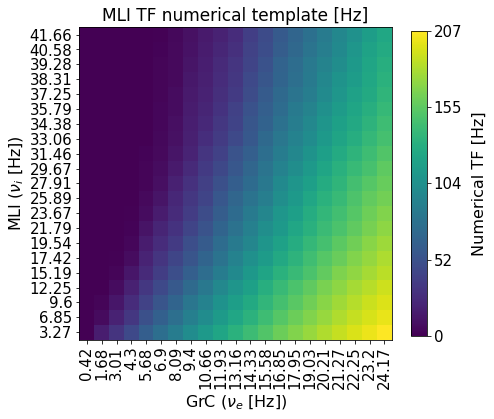

In [16]:
pop = 'MLI'
xname = 'GrC ($\\nu_{e}$ [Hz])'
yname = 'MLI ($\\nu_i$ [Hz])'
plot_cmap_2D_template(numTF_MLI, fe_mean, fi_mean, pop_name=pop, y_inhib_label=yname, x_excit_label=xname)

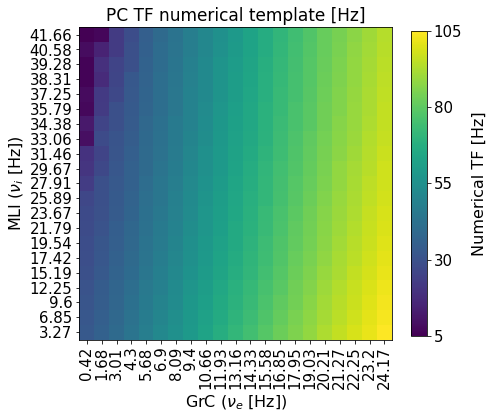

In [17]:
pop = 'PC'
xname = 'GrC ($\\nu_{e}$ [Hz])'
yname = 'MLI ($\\nu_i$ [Hz])'
plot_cmap_2D_template(numTF_PC, fe_mean, fi_mean, pop_name=pop, y_inhib_label=yname, x_excit_label=xname)

Could you infer something on the differences in the MLI and PC activity? (shape, trend....)

## Anlytical TF

Two step fitting procedure is implemented according to Zerlaut et al., 2018:

1) Fitting of the Phenomenological Threshold, accounting for single neuron specificity

2) Optimization of TF expression on numerical TF with LSQ method

Output: P coefficients of the phenomenological threshold that will be plugged into analytical TF

In [18]:
#pip install seaborn

In [19]:
#Initialisation of grid of frequencies (for the broadcasting into the functions) 
#Adaptation. Not included - leave it at zero.
w = np.zeros((len(fi_mean), len(fe_mean)))

fi_grid = np.ones((len(fi_mean), len(fe_mean)))
fe_grid = np.ones((len(fi_mean), len(fe_mean)))

fi_grid = (fi_grid*fi_mean).T #freq changes on the row (required .T)
fe_grid = fe_grid*fe_mean


### Fitting of MLI TF

In [20]:
muGe_MLI, muGi_MLI, muG_MLI, muV_MLI, sV_MLI, muGn_MLI, TvN_MLI = get_fluct_regime_varsup_eglif(fe_grid, fi_grid, w,
                                                                         *pseq_params_eglif(params_MLI), -50e-3)

In [21]:
#Explore qualitatively the staistics of membrane potential fluctuations and the popuation conductances
#plot_MF_statistics(muGe, muGi, muG, muV, sV, TvN)

In [22]:
alpha_MLI = 1.8
P_MLI = fitting_Vthre_then_Fout_eglif(muGe_MLI, muGi_MLI, muG_MLI, muV_MLI, sV_MLI, muGn_MLI, TvN_MLI, numTF_MLI, fe_grid, fi_grid, w, 
                                  params_MLI, alpha_MLI,
                                  maxiter=50000, xtol=1e-5)

Fout Limit:  207.2
OPTIMIZATION STEP 1 ==========================================
Vthre Optimization
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 35
         Function evaluations: 222
         Gradient evaluations: 37
========== P output from Vthreshold opt:  [-0.11222583 -0.0005209   0.02215487 -0.11282578 -0.11209982]
OPTIMIZATION STEP 2 ==========================================
Fout Optimization
Optimization terminated successfully.
         Current function value: 73.871240
         Iterations: 279
         Function evaluations: 462
========== P output from Fout opt:  [-0.12788521 -0.00122962  0.01215034 -0.09310483 -0.06317941]
END OF OPTIMIZATION PROCESS ==========================================


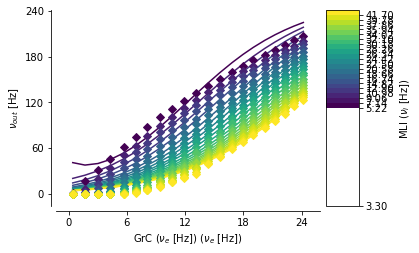

QUANTITATIVE SCORE!!!!!
 diff (Numerical TF - Analytic TF) [[ 3.81183906  4.88636546  6.32325984  8.07051152 10.39761028 11.61094504
  11.41179565 10.81053177  9.72836393  9.75713937  9.66891479  3.69635513
   2.53994533  0.41253901  0.47049351  0.49593422  1.59145074  2.2230201
   3.26018117  1.88149073  4.73051174]]
----------------------------------------
Mean diff +- stdev (numTF-SemiAnalyticTF) 5.608533256245036 +- 3.910179652490772
Min diff 0.4125390094695902


In [23]:
plot_TF_numerical_vs_analytical_2D(numTF_MLI, SD_MLI, fi_grid, fe_grid, w,
                                                 P_MLI, alpha_MLI, params_MLI, xname, barname='MLI')

### Fitting of PC TF

In [24]:
muGe_PC, muGi_PC, muG_PC, muV_PC, sV_PC, muGn_PC, TvN_PC = get_fluct_regime_varsup_eglif(fe_grid, fi_grid, w,
                                                                         *pseq_params_eglif(params_PC), -50e-3)

In [25]:
alpha_PC = 2.5
P_PC = fitting_Vthre_then_Fout_eglif(muGe_PC, muGi_PC, muG_PC, muV_PC, sV_PC, muGn_PC, TvN_PC, numTF_PC, 
                                  fe_grid, fi_grid, w, 
                                  params_PC, alpha_PC,
                                  maxiter=50000, xtol=1e-5)

Fout Limit:  105.33333333333333
OPTIMIZATION STEP 1 ==========================================
Vthre Optimization
Optimization terminated successfully.
         Current function value: 0.000001
         Iterations: 15
         Function evaluations: 114
         Gradient evaluations: 19
========== P output from Vthreshold opt:  [-0.07593978  0.00780045  0.00036006 -0.01290131  0.00845819]
OPTIMIZATION STEP 2 ==========================================
Fout Optimization
Optimization terminated successfully.
         Current function value: 4.826080
         Iterations: 282
         Function evaluations: 459
========== P output from Fout opt:  [-0.07999933  0.008472    0.00423417  0.00622404  0.01376171]
END OF OPTIMIZATION PROCESS ==========================================


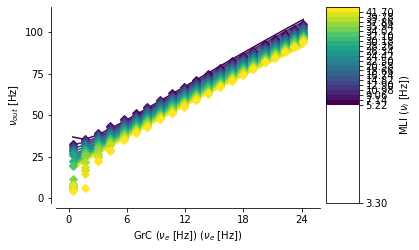

QUANTITATIVE SCORE!!!!!
 diff (Numerical TF - Analytic TF) [[1.30450078e+01 1.60400000e+01 4.61418816e+00 2.50527879e+00
  3.30513815e-01 1.29934949e-02 3.82288639e-01 2.61239675e-01
  2.44641038e-01 2.17694709e-01 3.85228953e-02 9.91289868e-02
  3.04646076e-01 4.73364793e-01 6.85612939e-01 1.00347564e+00
  1.59365515e+00 1.49155179e+00 1.93267154e+00 2.23195749e+00
  2.76414647e+00]]
----------------------------------------
Mean diff +- stdev (numTF-SemiAnalyticTF) 2.393932377599265 +- 4.129048726502025
Min diff 0.012993494903270175


In [26]:
plot_TF_numerical_vs_analytical_2D(numTF_PC, SD_PC, fi_grid, fe_grid, w,
                                                 P_PC, alpha_PC, params_PC, xname, barname='MLI')


## Mean Field Model

Here we are!!! We have all ingredients to solve the MF equations:
- Population specific TFs as computed above (for MLI and PC)
- Mean Field timing constant T (already optimized)
- Creativity to do a lot of different simulations

Run the cells below to simulate a first order mean field to compute the population-level activity of Molecular and Purkinje layers.

In [27]:
def solve_MF_CRBL_firstorder(TF_mli, TF_pc, time, h, T, v_mli0, v_pc0, v_grc, w= np.zeros(len(t))):

    v_mli = []
    v_pc = []

    # Euler method
    for t in range(len(time)):
        if t == 0:
            v_mli.append(v_mli0)
            v_pc.append(v_pc0)

        else:

            TF_mli_MF = TF_mli(v_grc[t-1], v_mli[t-1], w[t-1])
            TF_pc_MF = TF_pc(v_grc[t-1], v_mli[t-1],  w[t-1])

            update_v_mli = v_mli[t-1] + h * (TF_mli_MF - v_mli[t-1]) / T
            update_v_pc = v_pc[t-1] + h * (TF_pc_MF - v_pc[t-1]) / T

            v_mli.append(update_v_mli)
            v_pc.append(update_v_pc)


    return v_mli, v_pc


In [30]:
aTF_mli = load_transfer_functions('MLI', 'CRBL_CONFIG_20PARALLEL_wN', P_MLI, alpha_MLI)
aTF_pc = load_transfer_functions('PC', 'CRBL_CONFIG_20PARALLEL_wN', P_PC, alpha_PC)

synaptic network_scaffold parameters in SI units [V, F, s]
..................... Loading TFs
Neuron and Network:  MLI CRBL_CONFIG_20PARALLEL_wN
Loaded P:  [-0.12788521 -0.00122962  0.01215034 -0.09310483 -0.06317941]


synaptic network_scaffold parameters in SI units [V, F, s]
..................... Loading TFs
Neuron and Network:  PC CRBL_CONFIG_20PARALLEL_wN
Loaded P:  [-0.07999933  0.008472    0.00423417  0.00622404  0.01376171]




In [31]:
#mean field time constant
T = 3.5e-3

In [32]:
#initial condition
v_mli0, v_pc0 = 3.5, 38

In [33]:
#simulators parameters
dt = 1e-4
time = np.arange(0, 1 + dt, dt)
h = 1e-4

In [34]:
#driving input from GrC
f_backnoise = np.random.rand(len(time))*4

amplitude =5
freq1 = 15
freq2 = 30
freq3 = 1
f_sin1 = amplitude * np.sin(2 * np.pi * freq1 * time) + amplitude  # add amplitude value to avoid negative values
f_sin2 = amplitude * np.sin(2*np.pi*freq2*time) + amplitude
f_sin3 = amplitude * np.sin(2 * np.pi * freq3 * time) + amplitude

#v_grc = rect_input(time, t_start=2000, t_end=8000, minval=0, freq=20, noise_freq=4)

v_grc = f_sin1 + f_sin2 + f_sin3 + f_backnoise 

In [35]:
v_mli, v_pc = solve_MF_CRBL_firstorder(aTF_mli, aTF_pc, time, h, T, v_mli0, v_pc0, v_grc, w=np.zeros(len(t)))

In [36]:

def plot_MF_activity(t, v_grc, v_mli, v_pc):
    fig = go.Figure()

    fig = make_subplots(rows=3, cols=1)

    fig.add_trace(go.Scatter(x=t, y=v_grc,
                                 mode='lines',
                                 name='$\\nu_{drive}$',
                                 line=dict(color = "red")),
                      row=3, col=1
                      )
        
    fig.add_trace(go.Scatter(x=t, y=v_mli,
                                 mode='lines',
                                 name='$\\nu_{MLI}$',
                                 line=dict(color = "orange")),
                      row=2, col=1
                      )

    fig.add_trace(go.Scatter(x=t, y=v_pc,
                                 mode='lines',
                                 name='$\\nu_{PC}$',
                                 line=dict(color = "green")),
                      row=1, col=1
                      )


    fig.update_xaxes(title_text="time [s]", row=3, col=1)
    fig.update_xaxes(title_text="time [s]", row=2, col=1)
    fig.update_xaxes(title_text="time [s]", row=1, col=1)


    # Update yaxis properties
    fig.update_yaxes(title_text="GrC activity [Hz]", row=3, col=1)
    fig.update_yaxes(title_text="MLI activity [Hz]", row=2, col=1)
    fig.update_yaxes(title_text="PC activity [Hz]", row=1, col=1)

    # Update title
    fig.update_layout(title_text='Mean Field Prediction', height=900)
    fig.show()

plot_MF_activity(t, v_grc, v_mli, v_pc)

## It's your turn!

- Try other inputs from GrC
- PC plasticity in prediction: change GrC weight (driving input) on PC and compare PC activity with control condition.
- PC plasticity in prediction: change MLI synaptic weight (modify TF) on PC and compare PC activity with control condition.
- Second order MF (only the brave and who doesn't need coffe break ;) )
- ......


## References:

- E-GLIF: Geminiani et al 2018, 2019 (https://doi.org/10.3389/fninf.2018.00088 and https://doi.org/10.3389/fncom.2019.00035)
- Mathematics: Boustani and Destexhe 2009 (https://doi.org/10.1162/neco.2009.02-08-710)
- TF formalism: Zerlaut et al. 2018 (https://doi.org/10.1007/s10827-017-0668-2)
- TF Fitting procedure: Zerlaut et al. 2016  (https://doi.org/10.1113/JP272317)
- MF with adaptation: Di Volo et al. 2019 (https://doi.org/10.1162/neco_a_01173)
- MF review for different neuron model: Carlu et al. 2020 (https://doi.org/10.1152/jn.00399.2019)